In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install segmentation_models_pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 5.9 MB/s eta 0:00:00


In [3]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 73.1 MB/s eta 0:00:00


In [4]:
import os
import cv2
import numpy as np
import rasterio
import glob
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import random
import torch

In [5]:
dataset_path_rgn = "drive/MyDrive/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])

        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [6]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84
)

In [7]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

test_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"))

        mask = (mask > 0).astype(np.uint8)

        if self.transform:
            augmented = self.transform(image = image, mask = mask)
            image, mask = augmented["image"], augmented["mask"]

        return image, mask, image_path, mask_path

In [8]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 8, pin_memory = False, shuffle = True, num_workers = 8)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [9]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [10]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[-1.8782, -1.5357, -1.6042,  ..., -0.5596, -0.6109, -0.6281],
         [-1.5699, -1.6898, -1.6384,  ..., -0.5767, -0.5938, -0.5938],
         [-1.4329, -1.9295, -1.7412,  ..., -0.5938, -0.5596, -0.5424],
         ...,
         [-1.1075, -1.2103, -1.4500,  ..., -0.4054, -0.0801, -0.4226],
         [-1.2788, -1.3644, -1.3987,  ..., -0.0287,  0.3138,  0.3309],
         [-1.7583, -1.8610, -1.7412,  ..., -0.0629,  0.0398,  0.1254]],

        [[-1.5105, -1.1604, -1.2304,  ..., -0.7577, -0.7577, -0.7752],
         [-1.1954, -1.3179, -1.2654,  ..., -0.7752, -0.7402, -0.7402],
         [-1.0553, -1.5630, -1.3704,  ..., -0.7927, -0.7577, -0.7402],
         ...,
         [-0.7752, -0.8803, -1.1253,  ..., -0.2500,  0.0826, -0.2675],
         [-0.9503, -1.0378, -1.0728,  ...,  0.1352,  0.4853,  0.5028],
         [-1.4405, -1.5455, -1.4230,  ...,  0.1001,  0.2052,  0.2927]],

        [[-1.4733, -1.1247, -1.1944,  ..., -0.6018, -0.6193, -0.6367],
         [-1.1596, -1.2816, -1.2293,  ..., -0

In [11]:
print(mask_train)
print(mask_train.shape)

tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [12]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[-1.3473, -1.4500, -1.4672,  ..., -0.5596, -0.2856, -1.2788],
         [-1.0390, -1.1418, -1.2103,  ..., -0.8507, -0.9192, -1.4158],
         [-0.9192, -0.9877, -1.0733,  ..., -1.5014, -1.3815, -1.0562],
         ...,
         [ 0.8789,  0.8961,  0.9303,  ..., -0.9363, -0.9705, -1.5699],
         [ 0.8789,  0.8961,  0.9132,  ..., -1.6384, -1.6555, -1.5185],
         [ 0.8618,  0.8789,  0.8961,  ..., -1.7412, -1.9809, -1.6555]],

        [[-1.1954, -1.3004, -1.3179,  ..., -0.4076, -0.0924, -1.1078],
         [-0.8803, -0.9853, -1.0553,  ..., -0.6527, -0.7402, -1.2129],
         [-0.7402, -0.8102, -0.8978,  ..., -1.3004, -1.1779, -0.7927],
         ...,
         [ 1.0280,  1.0455,  1.0805,  ..., -0.6877, -0.7227, -1.3354],
         [ 1.0280,  1.0455,  1.0630,  ..., -1.4055, -1.4405, -1.3004],
         [ 1.0105,  1.0280,  1.0455,  ..., -1.5105, -1.7731, -1.4405]],

        [[-1.1596, -1.2641, -1.2816,  ..., -0.2358,  0.1128, -0.8981],
         [-0.8458, -0.9504, -1.0201,  ..., -0

In [13]:
print(mask_test)
print(mask_test.shape)

tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [14]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[-0.8507, -1.0390, -1.1247,  ..., -1.4672, -1.2788, -1.2617],
         [-1.0733, -0.9192, -1.3130,  ..., -1.5014, -1.4500, -1.5357],
         [-1.0390, -0.6965, -1.1589,  ..., -1.3473, -1.3987, -1.5014],
         ...,
         [-1.3644, -1.3473, -1.3644,  ..., -0.9705, -0.6965, -0.9363],
         [-1.3987, -1.3644, -1.3644,  ..., -0.5253, -0.6452, -0.7993],
         [-1.4158, -1.3815, -1.3644,  ..., -0.9534, -0.6281, -0.5767]],

        [[-0.5126, -0.7052, -0.8102,  ..., -1.0028, -0.8102, -0.7927],
         [-0.7402, -0.5826, -1.0028,  ..., -1.0378, -0.9853, -1.0728],
         [-0.7052, -0.3550, -0.8277,  ..., -0.8803, -0.9328, -1.0378],
         ...,
         [-0.9153, -0.8978, -0.9153,  ..., -0.5301, -0.3375, -0.5826],
         [-0.9503, -0.9153, -0.9153,  ..., -0.0749, -0.2850, -0.4426],
         [-0.9678, -0.9328, -0.9153,  ..., -0.5126, -0.2675, -0.2150]],

        [[-0.4624, -0.6541, -0.7936,  ..., -0.8981, -0.7064, -0.6890],
         [-0.6890, -0.5321, -0.9853,  ..., -0

In [15]:
print(mask_val)
print(mask_val.shape)

tensor([[0, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 0, 1,  ..., 1, 1, 1],
        ...,
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1]], dtype=torch.uint8)
torch.Size([256, 256])


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [19]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [20]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256]

In [21]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [22]:
for img, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [23]:
import segmentation_models_pytorch as smp
import torch.nn as nn
import torch.nn.functional as F

class ChannelSELayer(nn.Module):
    def __init__(self, num_channels, reduction_ratio = 16):
        super(ChannelSELayer, self).__init__()
        num_channels_reduced = max(1, num_channels // reduction_ratio)
        self.fc1 = nn.Linear(num_channels, num_channels_reduced, bias = True)
        self.fc2 = nn.Linear(num_channels_reduced, num_channels, bias = True)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, input_tensor):
        batch_size, num_channels, H, W = input_tensor.size()

        squeeze_tensor = input_tensor.view(batch_size, num_channels, -1).mean(dim = 2)

        fc_out_1 = self.relu(self.fc1(squeeze_tensor))
        fc_out_2 = self.sigmoid(self.fc2(fc_out_1))

        return input_tensor * fc_out_2.view(batch_size, num_channels, 1, 1)

class CustomDeepLabV3Plus(nn.Module):
    def __init__(self, encoder_name = "resnet101", encoder_weights = "imagenet", in_channels = 3, classes = 1):
        super(CustomDeepLabV3Plus, self).__init__()
        self.base_model = smp.DeepLabV3Plus(
            encoder_name = encoder_name,
            encoder_weights = encoder_weights,
            in_channels = in_channels,
            classes = 256,
            activation = None
        )

        self.head = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding = 1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace = True),
            ChannelSELayer(128),
            nn.Dropout2d(0.5),
            nn.Conv2d(128, 64, 3, padding = 1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace = True),
            ChannelSELayer(64),
            nn.Dropout2d(0.5),
            nn.Conv2d(64, classes, 1)
        )

    def forward(self, x):
        x = self.base_model(x)
        x = self.head(x)
        return x

def batchnorm_to_groupnorm(model, num_groups = 32):
    for name, module in model.named_children():
        if isinstance(module, nn.BatchNorm2d):
            num_features = module.num_features
            valid_num_groups = min(num_groups, num_features)
            while num_features % valid_num_groups != 0 and valid_num_groups > 1:
                valid_num_groups -= 1
            setattr(model, name, nn.GroupNorm(num_groups = valid_num_groups, num_channels = num_features))
        else:
            batchnorm_to_groupnorm(module, num_groups)
    return model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

deeplab_model = CustomDeepLabV3Plus(
    encoder_name = "resnet101",
    encoder_weights = "imagenet",
    in_channels = 3,
    classes = 1
)

deeplab_model = batchnorm_to_groupnorm(deeplab_model)
deeplab_model.to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/179M [00:00<?, ?B/s]

CustomDeepLabV3Plus(
  (base_model): DeepLabV3Plus(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
  

In [24]:
def calc_iou(pred, gt):
    with torch.no_grad():
        pred = (pred.sigmoid() > 0.5).long()
        pred, gt = pred.contiguous().view(-1), gt.contiguous().view(-1)

        if gt.sum() == 0:
          if pred.sum() == 0:
            return 1.0
          else:
            return 0.0

        intersect = torch.logical_and(pred > 0, gt > 0).sum().float().item()
        union = torch.logical_or(pred > 0, gt > 0).sum().float().item()

        iou = (intersect + 1e-6) / (union + 1e-6)

    return iou

In [25]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        inputs = torch.sigmoid(inputs)

        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice_loss = 1 - (2.0 * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)

        bce = F.binary_cross_entropy(inputs, targets, reduction = 'none')
        pt = torch.exp(-bce)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce).mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [26]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 12.9 MB/s eta 0:00:00


In [73]:
import torch.optim as optim
from tqdm import tqdm
import optuna
import warnings
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR, CosineAnnealingLR

device = "cuda" if torch.cuda.is_available() else "cpu"

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)
    optimizer = optim.Adam(model.parameters(), lr = 0.0001)

    num_epoch = 25

    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    trigger = 0
    best_val_loss = float('inf')
    best_model = None

    for epoch in range(num_epoch):
        model.train()
        total_loss = 0
        total_iou = 0

        for images, masks, images_path, masks_path in tqdm(train_loader):
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()

            outputs = model(images)
            loss = loss_func(outputs, masks.float())
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(outputs, masks)

        avg_loss = total_loss / len(train_loader)
        avg_iou = total_iou / len(train_loader)

        print(f"Epoch {epoch+1}/{num_epoch}:")
        print(f"Train loss: {avg_loss}, Train Avg IoU: {avg_iou}\n")

        model.eval()
        val_loss = 0
        val_total_iou = 0

        with torch.no_grad():
            for val_images, val_masks, val_images_path, val_masks_path in tqdm(val_loader):
                val_images, val_masks = val_images.to(device), val_masks.to(device)
                val_output = model(val_images)
                val_loss += loss_func(val_output, val_masks.float()).item()

                val_batch_iou = calc_iou(val_output, val_masks)
                val_total_iou += val_batch_iou

        val_avg_loss = val_loss / len(val_loader)
        val_avg_iou = val_total_iou / len(val_loader)

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()

        print(f"Val loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1

        if trigger >= patience:
            print(f"Stop at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [74]:
import gc

fine_tune_model = None

def objective(trial):
    global fine_tune_model
    torch.cuda.empty_cache()
    gc.collect()

    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(1.0, 0.0), (0.7, 0.3), (0.5, 0.5), (0.3, 0.7), (0.1, 0.9), (0.0, 1.0)])

    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")

    deeplab_model = CustomDeepLabV3Plus(
        encoder_name = "resnet101",
        encoder_weights = "imagenet",
        in_channels = 3,
        classes = 1
    )

    deeplab_model = batchnorm_to_groupnorm(deeplab_model)
    deeplab_model.to(device)

    model, val_loss = train_model(
        model = deeplab_model,
        train_loader = train_loader,
        val_loader = val_loader,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_model = model

    return val_loss

In [75]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(1.0, 0.0)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 3)

[I 2025-11-16 14:00:04,935] A new study created in memory with name: no-name-086c3e0d-5b0a-4b1b-a060-f8b2d8975742


Trial 0: scheduler = cosine, dice weight = 1.0, focal weight = 0.0



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 1/25:
Train loss: 0.45448414153522915, Train Avg IoU: 0.48284476067012894



100%|██████████| 3/3 [00:00<00:00,  3.25it/s]


Val loss: 0.3558371861775716, Val Avg IoU: 0.6519117430290766



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 2/25:
Train loss: 0.3761490384737651, Train Avg IoU: 0.6313772518292504



100%|██████████| 3/3 [00:00<00:00,  3.20it/s]


Val loss: 0.3133080204327901, Val Avg IoU: 0.6970447705835108



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 3/25:
Train loss: 0.3461720049381256, Train Avg IoU: 0.664382541036449



100%|██████████| 3/3 [00:01<00:00,  2.62it/s]


Val loss: 0.29699941476186115, Val Avg IoU: 0.7181465790415924



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 4/25:
Train loss: 0.32668182916111416, Train Avg IoU: 0.6976767474386185



100%|██████████| 3/3 [00:01<00:00,  2.41it/s]


Val loss: 0.2834112246831258, Val Avg IoU: 0.750985808381745



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 5/25:
Train loss: 0.318467292520735, Train Avg IoU: 0.6996419281748726



100%|██████████| 3/3 [00:01<00:00,  2.73it/s]


Val loss: 0.27435189485549927, Val Avg IoU: 0.7486331441109716



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 6/25:
Train loss: 0.3055704931418101, Train Avg IoU: 0.7320036721801227



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.25837357838948566, Val Avg IoU: 0.7873234921853448



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 7/25:
Train loss: 0.29222073819902206, Train Avg IoU: 0.7505347494184351



100%|██████████| 3/3 [00:00<00:00,  3.26it/s]


Val loss: 0.2473373015721639, Val Avg IoU: 0.8183858929042426



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 8/25:
Train loss: 0.2815515697002411, Train Avg IoU: 0.7770515207406178



100%|██████████| 3/3 [00:00<00:00,  3.29it/s]


Val loss: 0.23983103036880493, Val Avg IoU: 0.8273262896211026



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 9/25:
Train loss: 0.27151837944984436, Train Avg IoU: 0.7817862514600031



100%|██████████| 3/3 [00:00<00:00,  3.34it/s]


Val loss: 0.23486689726511636, Val Avg IoU: 0.8307281602767214



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 10/25:
Train loss: 0.2673264145851135, Train Avg IoU: 0.7882282303926407



100%|██████████| 3/3 [00:00<00:00,  3.27it/s]


Val loss: 0.22991728782653809, Val Avg IoU: 0.8322922411778592



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 11/25:
Train loss: 0.26650652289390564, Train Avg IoU: 0.7970255272517676



100%|██████████| 3/3 [00:01<00:00,  2.76it/s]


Val loss: 0.22286593914031982, Val Avg IoU: 0.8462196394280506



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 12/25:
Train loss: 0.2503287394841512, Train Avg IoU: 0.8135280554475397



100%|██████████| 3/3 [00:01<00:00,  2.51it/s]


Val loss: 0.2204888860384623, Val Avg IoU: 0.8415379389512254



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 13/25:
Train loss: 0.24863403704431322, Train Avg IoU: 0.8140777970192108



100%|██████████| 3/3 [00:00<00:00,  3.09it/s]


Val loss: 0.2198940912882487, Val Avg IoU: 0.8410561282264828



100%|██████████| 18/18 [00:10<00:00,  1.64it/s]


Epoch 14/25:
Train loss: 0.24774918291303846, Train Avg IoU: 0.8139318407875035



100%|██████████| 3/3 [00:00<00:00,  3.31it/s]


Val loss: 0.2145297328631083, Val Avg IoU: 0.846639495086416



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 15/25:
Train loss: 0.2415786021285587, Train Avg IoU: 0.8232744085523406



100%|██████████| 3/3 [00:00<00:00,  3.26it/s]


Val loss: 0.21448918183644614, Val Avg IoU: 0.8449198498775559



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 16/25:
Train loss: 0.2507564922173818, Train Avg IoU: 0.8150942862080685



100%|██████████| 3/3 [00:00<00:00,  3.17it/s]


Val loss: 0.21275166670481363, Val Avg IoU: 0.8445418873119022



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 17/25:
Train loss: 0.24739684992366368, Train Avg IoU: 0.8168812826087822



100%|██████████| 3/3 [00:00<00:00,  3.18it/s]


Val loss: 0.20862972736358643, Val Avg IoU: 0.8500750578229251



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 18/25:
Train loss: 0.23444988992479113, Train Avg IoU: 0.8225663082260601



100%|██████████| 3/3 [00:00<00:00,  3.21it/s]


Val loss: 0.2084549069404602, Val Avg IoU: 0.8511729577170484



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 19/25:
Train loss: 0.23448384139272901, Train Avg IoU: 0.8262449061252835



100%|██████████| 3/3 [00:01<00:00,  2.68it/s]


Val loss: 0.2076695958773295, Val Avg IoU: 0.849103753142128



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 20/25:
Train loss: 0.2344106568230523, Train Avg IoU: 0.8218244057822919



100%|██████████| 3/3 [00:01<00:00,  2.51it/s]


Val loss: 0.2079306642214457, Val Avg IoU: 0.8496176661325618



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 21/25:
Train loss: 0.23487417896588644, Train Avg IoU: 0.8281629770742851



100%|██████████| 3/3 [00:00<00:00,  3.16it/s]


Val loss: 0.2059465448061625, Val Avg IoU: 0.8500403222316496



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 22/25:
Train loss: 0.23377417193518746, Train Avg IoU: 0.822111130186002



100%|██████████| 3/3 [00:00<00:00,  3.26it/s]


Val loss: 0.20657662550608316, Val Avg IoU: 0.8505834094045492



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 23/25:
Train loss: 0.2420963313844469, Train Avg IoU: 0.8263724024075371



100%|██████████| 3/3 [00:00<00:00,  3.23it/s]


Val loss: 0.2060433030128479, Val Avg IoU: 0.8499726564011877



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 24/25:
Train loss: 0.23939893311924404, Train Avg IoU: 0.8280593176538495



100%|██████████| 3/3 [00:00<00:00,  3.23it/s]


Val loss: 0.20586989323298135, Val Avg IoU: 0.8502724417227636



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 25/25:
Train loss: 0.23011615872383118, Train Avg IoU: 0.8172396389116711



100%|██████████| 3/3 [00:00<00:00,  3.08it/s]
[I 2025-11-16 14:04:57,464] Trial 0 finished with value: 0.20586989323298135 and parameters: {'scheduler': 'cosine', 'loss_weight': (1.0, 0.0)}. Best is trial 0 with value: 0.20586989323298135.


Val loss: 0.20587905248006186, Val Avg IoU: 0.8503719680225349

Trial 1: scheduler = reducelr, dice weight = 1.0, focal weight = 0.0



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 1/25:
Train loss: 0.4218681752681732, Train Avg IoU: 0.5059593481636107



100%|██████████| 3/3 [00:00<00:00,  3.20it/s]


Val loss: 0.33208781480789185, Val Avg IoU: 0.6421601980530031



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 2/25:
Train loss: 0.35486910740534466, Train Avg IoU: 0.6120064922059427



100%|██████████| 3/3 [00:00<00:00,  3.11it/s]


Val loss: 0.29156796137491864, Val Avg IoU: 0.7122287608635024



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 3/25:
Train loss: 0.3238995737499661, Train Avg IoU: 0.6765958118819997



100%|██████████| 3/3 [00:01<00:00,  2.47it/s]


Val loss: 0.2761100133260091, Val Avg IoU: 0.7404606410418703



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 4/25:
Train loss: 0.3173929982715183, Train Avg IoU: 0.7022795522486995



100%|██████████| 3/3 [00:01<00:00,  2.60it/s]


Val loss: 0.2613438367843628, Val Avg IoU: 0.7772019698594033



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 5/25:
Train loss: 0.30177540249294704, Train Avg IoU: 0.7310696190753805



100%|██████████| 3/3 [00:00<00:00,  3.32it/s]


Val loss: 0.2529764374097188, Val Avg IoU: 0.7972971234104816



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 6/25:
Train loss: 0.3018035689989726, Train Avg IoU: 0.7205126085212189



100%|██████████| 3/3 [00:00<00:00,  3.29it/s]


Val loss: 0.24956947565078735, Val Avg IoU: 0.7874466374970611



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 7/25:
Train loss: 0.2916092276573181, Train Avg IoU: 0.7416183176393516



100%|██████████| 3/3 [00:00<00:00,  3.33it/s]


Val loss: 0.24548558394114176, Val Avg IoU: 0.8066707654616296



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 8/25:
Train loss: 0.2851468092865414, Train Avg IoU: 0.7550809730847092



100%|██████████| 3/3 [00:00<00:00,  3.32it/s]


Val loss: 0.23709750175476074, Val Avg IoU: 0.8117458143154973



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 9/25:
Train loss: 0.27795825401941937, Train Avg IoU: 0.7720531685373098



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.22936904430389404, Val Avg IoU: 0.8316882034576006



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 10/25:
Train loss: 0.26805374026298523, Train Avg IoU: 0.7834381579923946



100%|██████████| 3/3 [00:01<00:00,  2.87it/s]


Val loss: 0.22446638345718384, Val Avg IoU: 0.8332884838332802



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 11/25:
Train loss: 0.26295175817277694, Train Avg IoU: 0.7942390365418457



100%|██████████| 3/3 [00:01<00:00,  2.47it/s]


Val loss: 0.2220455209414164, Val Avg IoU: 0.8268128860483938



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 12/25:
Train loss: 0.25169240434964496, Train Avg IoU: 0.7995916505713743



100%|██████████| 3/3 [00:01<00:00,  2.55it/s]


Val loss: 0.22393463055292764, Val Avg IoU: 0.826241464612005



100%|██████████| 18/18 [00:10<00:00,  1.64it/s]


Epoch 13/25:
Train loss: 0.259932945171992, Train Avg IoU: 0.7680165575127753



100%|██████████| 3/3 [00:00<00:00,  3.25it/s]


Val loss: 0.21558475494384766, Val Avg IoU: 0.8271732387813332



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 14/25:
Train loss: 0.2530486385027568, Train Avg IoU: 0.7946615749467196



100%|██████████| 3/3 [00:00<00:00,  3.16it/s]


Val loss: 0.2071597178777059, Val Avg IoU: 0.8385662624515716



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 15/25:
Train loss: 0.24175593588087294, Train Avg IoU: 0.8081328154882743



100%|██████████| 3/3 [00:00<00:00,  3.23it/s]


Val loss: 0.20338336626688638, Val Avg IoU: 0.8396803316361825



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 16/25:
Train loss: 0.24024523297945657, Train Avg IoU: 0.8041719053658407



100%|██████████| 3/3 [00:00<00:00,  3.29it/s]


Val loss: 0.2009161909421285, Val Avg IoU: 0.8440175551155891



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 17/25:
Train loss: 0.23141130142741734, Train Avg IoU: 0.8126911734040912



100%|██████████| 3/3 [00:00<00:00,  3.33it/s]


Val loss: 0.19705973068873087, Val Avg IoU: 0.8335185568129454



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 18/25:
Train loss: 0.2299428317281935, Train Avg IoU: 0.8161797654380796



100%|██████████| 3/3 [00:01<00:00,  2.78it/s]


Val loss: 0.19375809033711752, Val Avg IoU: 0.843797164407102



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 19/25:
Train loss: 0.22826094759835136, Train Avg IoU: 0.8116465507738035



100%|██████████| 3/3 [00:01<00:00,  2.44it/s]


Val loss: 0.186361292997996, Val Avg IoU: 0.8527056953272218



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 20/25:
Train loss: 0.21759621964560616, Train Avg IoU: 0.8221842927400002



100%|██████████| 3/3 [00:01<00:00,  2.74it/s]


Val loss: 0.18478737274805704, Val Avg IoU: 0.8528248118711321



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 21/25:
Train loss: 0.22318950295448303, Train Avg IoU: 0.798085319007732



100%|██████████| 3/3 [00:00<00:00,  3.16it/s]


Val loss: 0.18631531794865927, Val Avg IoU: 0.8405323161848631



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 22/25:
Train loss: 0.22050793634520638, Train Avg IoU: 0.8143683852257105



100%|██████████| 3/3 [00:00<00:00,  3.08it/s]


Val loss: 0.17666097482045492, Val Avg IoU: 0.8523272212377245



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 23/25:
Train loss: 0.21720734900898403, Train Avg IoU: 0.8076123172371862



100%|██████████| 3/3 [00:00<00:00,  3.13it/s]


Val loss: 0.18099693457285562, Val Avg IoU: 0.8421534183026688



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 24/25:
Train loss: 0.20819832881291708, Train Avg IoU: 0.8185816375777157



100%|██████████| 3/3 [00:00<00:00,  3.18it/s]


Val loss: 0.17256700992584229, Val Avg IoU: 0.8468358948695492



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 25/25:
Train loss: 0.20493947135077584, Train Avg IoU: 0.8228587816122895



100%|██████████| 3/3 [00:00<00:00,  3.08it/s]
[I 2025-11-16 14:09:50,247] Trial 1 finished with value: 0.16765119632085165 and parameters: {'scheduler': 'reducelr', 'loss_weight': (1.0, 0.0)}. Best is trial 1 with value: 0.16765119632085165.


Val loss: 0.16765119632085165, Val Avg IoU: 0.85136566801009

Trial 2: scheduler = steplr, dice weight = 1.0, focal weight = 0.0



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 1/25:
Train loss: 0.4352685246202681, Train Avg IoU: 0.5139725085115349



100%|██████████| 3/3 [00:00<00:00,  3.13it/s]


Val loss: 0.3459780216217041, Val Avg IoU: 0.6334184055969841



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 2/25:
Train loss: 0.37508418162663776, Train Avg IoU: 0.6060883165739055



100%|██████████| 3/3 [00:01<00:00,  2.59it/s]


Val loss: 0.31417856613794964, Val Avg IoU: 0.7076665016454252



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 3/25:
Train loss: 0.34868957267867196, Train Avg IoU: 0.6659429087007723



100%|██████████| 3/3 [00:01<00:00,  2.55it/s]


Val loss: 0.300624152024587, Val Avg IoU: 0.7249119459028451



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 4/25:
Train loss: 0.33510579334365, Train Avg IoU: 0.6853104241235937



100%|██████████| 3/3 [00:01<00:00,  2.80it/s]


Val loss: 0.2914801438649495, Val Avg IoU: 0.7451435141623538



100%|██████████| 18/18 [00:11<00:00,  1.62it/s]


Epoch 5/25:
Train loss: 0.3235773808426327, Train Avg IoU: 0.7180642844297253



100%|██████████| 3/3 [00:00<00:00,  3.31it/s]


Val loss: 0.28034977118174237, Val Avg IoU: 0.7685004563254255



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 6/25:
Train loss: 0.3177281717459361, Train Avg IoU: 0.7202381168919652



100%|██████████| 3/3 [00:00<00:00,  3.18it/s]


Val loss: 0.27346185843149823, Val Avg IoU: 0.7885440617240261



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 7/25:
Train loss: 0.31582698888248867, Train Avg IoU: 0.7336338797875877



100%|██████████| 3/3 [00:00<00:00,  3.20it/s]


Val loss: 0.2681952714920044, Val Avg IoU: 0.8031282773424105



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 8/25:
Train loss: 0.3065948651896583, Train Avg IoU: 0.75776094877626



100%|██████████| 3/3 [00:00<00:00,  3.25it/s]


Val loss: 0.26270047823588055, Val Avg IoU: 0.8173222184332231



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 9/25:
Train loss: 0.30193861656718785, Train Avg IoU: 0.7667689968400394



100%|██████████| 3/3 [00:00<00:00,  3.20it/s]


Val loss: 0.25804521640141803, Val Avg IoU: 0.8285511544169912



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 10/25:
Train loss: 0.2914169397619035, Train Avg IoU: 0.7855977636939676



100%|██████████| 3/3 [00:01<00:00,  2.67it/s]


Val loss: 0.2530657847722371, Val Avg IoU: 0.8388426643482809



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 11/25:
Train loss: 0.28770697447988725, Train Avg IoU: 0.7905790134934194



100%|██████████| 3/3 [00:01<00:00,  2.30it/s]


Val loss: 0.25152941544850665, Val Avg IoU: 0.8379320249623028



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 12/25:
Train loss: 0.28664784630139667, Train Avg IoU: 0.802953330468189



100%|██████████| 3/3 [00:01<00:00,  2.57it/s]


Val loss: 0.2472697893778483, Val Avg IoU: 0.8435061147033919



100%|██████████| 18/18 [00:11<00:00,  1.61it/s]


Epoch 13/25:
Train loss: 0.28334574898084003, Train Avg IoU: 0.8083053544871246



100%|██████████| 3/3 [00:00<00:00,  3.29it/s]


Val loss: 0.2462472915649414, Val Avg IoU: 0.8431660049443713



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 14/25:
Train loss: 0.2831002175807953, Train Avg IoU: 0.8072999053315175



100%|██████████| 3/3 [00:00<00:00,  3.13it/s]


Val loss: 0.24485405286153158, Val Avg IoU: 0.8376940453255104



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 15/25:
Train loss: 0.2794363962279426, Train Avg IoU: 0.7977955576003024



100%|██████████| 3/3 [00:00<00:00,  3.04it/s]


Val loss: 0.242139200369517, Val Avg IoU: 0.8448578351862456



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 16/25:
Train loss: 0.28182236353556317, Train Avg IoU: 0.8135547649408594



100%|██████████| 3/3 [00:00<00:00,  3.25it/s]


Val loss: 0.24139885107676187, Val Avg IoU: 0.8454760558748244



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 17/25:
Train loss: 0.28167262342241073, Train Avg IoU: 0.8011636129420654



100%|██████████| 3/3 [00:00<00:00,  3.27it/s]


Val loss: 0.24115711450576782, Val Avg IoU: 0.8458991664358001



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 18/25:
Train loss: 0.2732781238026089, Train Avg IoU: 0.814617563861501



100%|██████████| 3/3 [00:00<00:00,  3.22it/s]


Val loss: 0.24012734492619833, Val Avg IoU: 0.8479571121963206



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 19/25:
Train loss: 0.26986735065778095, Train Avg IoU: 0.8213937379933488



100%|██████████| 3/3 [00:01<00:00,  2.51it/s]


Val loss: 0.23993430534998575, Val Avg IoU: 0.8425528775161276



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 20/25:
Train loss: 0.2735033366415236, Train Avg IoU: 0.8152473318070828



100%|██████████| 3/3 [00:01<00:00,  2.56it/s]


Val loss: 0.23885623613993326, Val Avg IoU: 0.8460151924943501



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 21/25:
Train loss: 0.278478784693612, Train Avg IoU: 0.8106520262448282



100%|██████████| 3/3 [00:00<00:00,  3.20it/s]


Val loss: 0.23846121629079184, Val Avg IoU: 0.8470529506877639



100%|██████████| 18/18 [00:11<00:00,  1.62it/s]


Epoch 22/25:
Train loss: 0.27261996931499904, Train Avg IoU: 0.8164332683742959



100%|██████████| 3/3 [00:00<00:00,  3.24it/s]


Val loss: 0.23896721998850504, Val Avg IoU: 0.8476024195757389



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 23/25:
Train loss: 0.26719383398691815, Train Avg IoU: 0.818340562557499



100%|██████████| 3/3 [00:00<00:00,  3.27it/s]


Val loss: 0.23749661445617676, Val Avg IoU: 0.8469326211710159



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 24/25:
Train loss: 0.2735046115186479, Train Avg IoU: 0.8160674697168511



100%|██████████| 3/3 [00:00<00:00,  3.18it/s]


Val loss: 0.2378476858139038, Val Avg IoU: 0.8491010174618858



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 25/25:
Train loss: 0.2722762127717336, Train Avg IoU: 0.8185654446935156



100%|██████████| 3/3 [00:00<00:00,  3.26it/s]
[I 2025-11-16 14:14:44,290] Trial 2 finished with value: 0.23749661445617676 and parameters: {'scheduler': 'steplr', 'loss_weight': (1.0, 0.0)}. Best is trial 1 with value: 0.16765119632085165.


Val loss: 0.2377809484799703, Val Avg IoU: 0.8478942272540958



In [76]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'reducelr', 'loss_weight': (1.0, 0.0)}
Best val loss: 0.16765119632085165


In [77]:
fine_tune_model.eval()

CustomDeepLabV3Plus(
  (base_model): DeepLabV3Plus(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
  

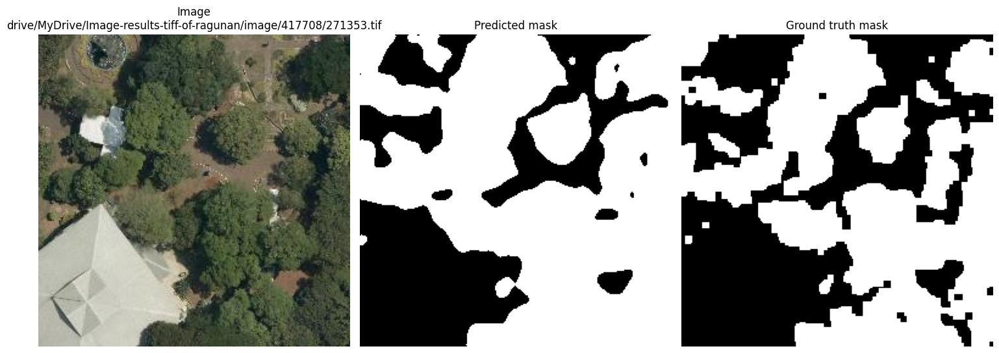

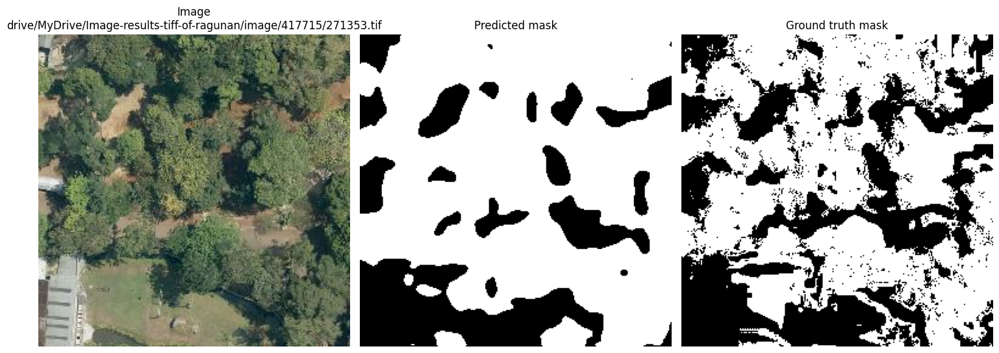

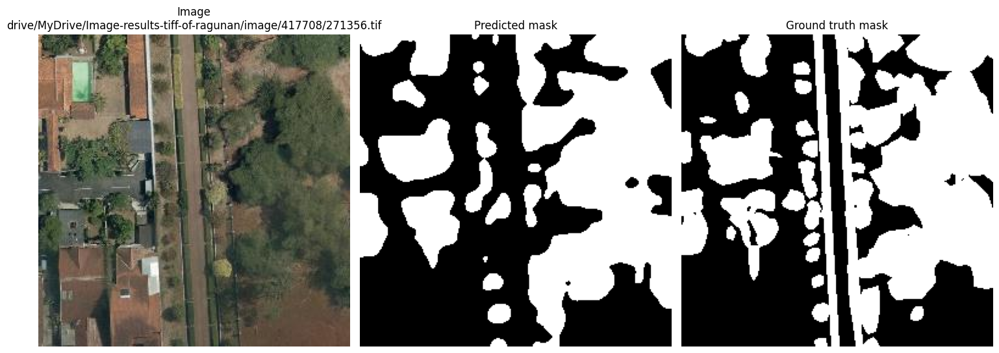

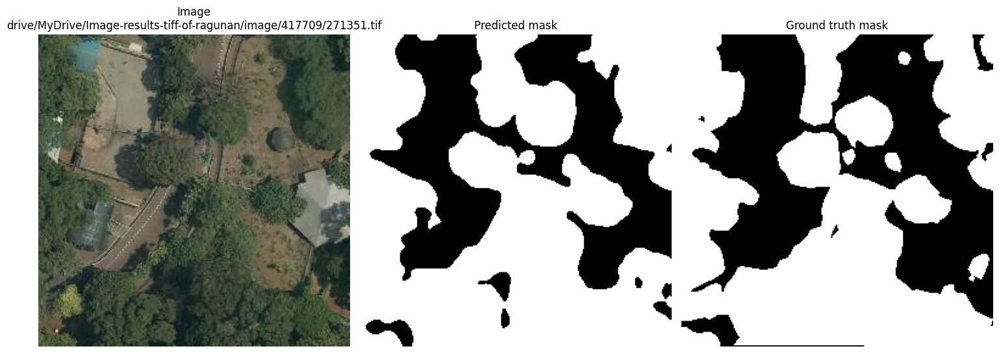

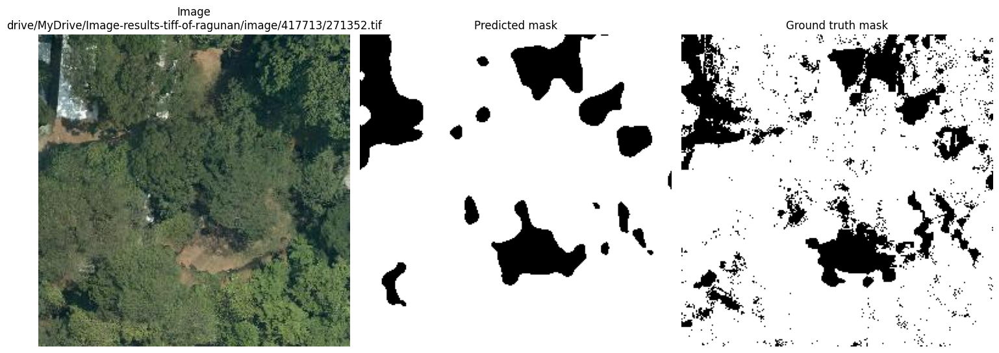

...

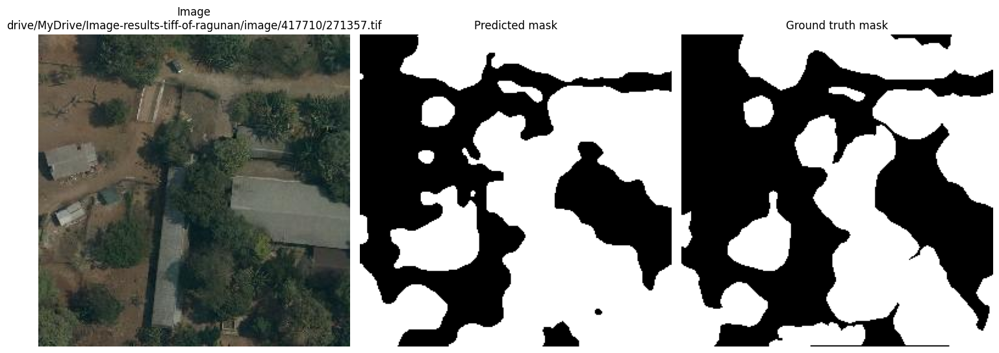

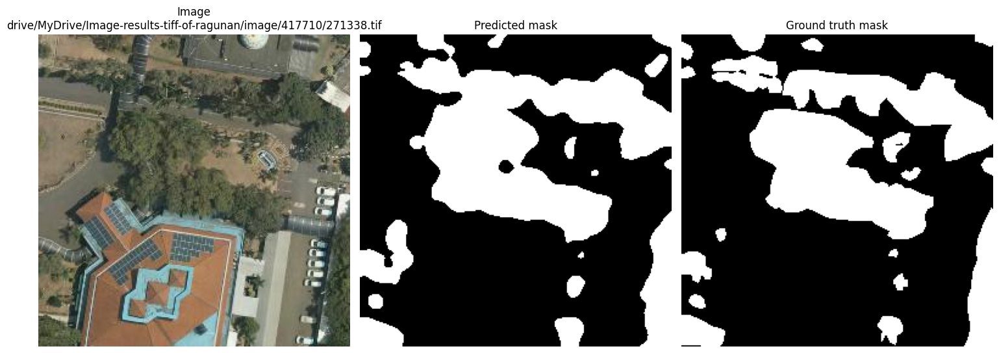

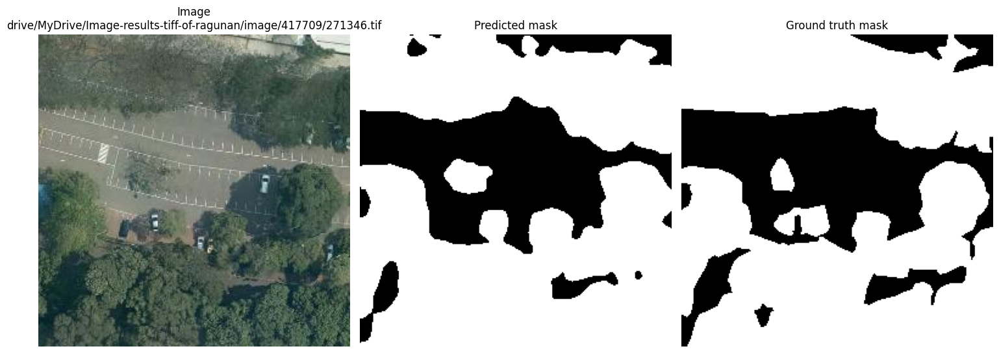

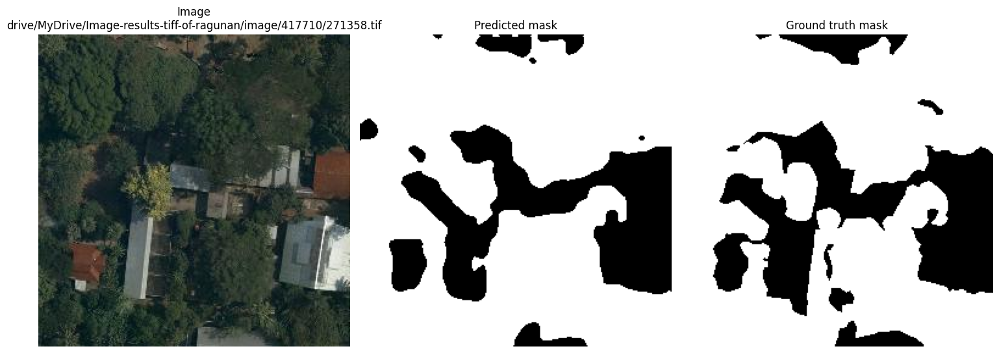

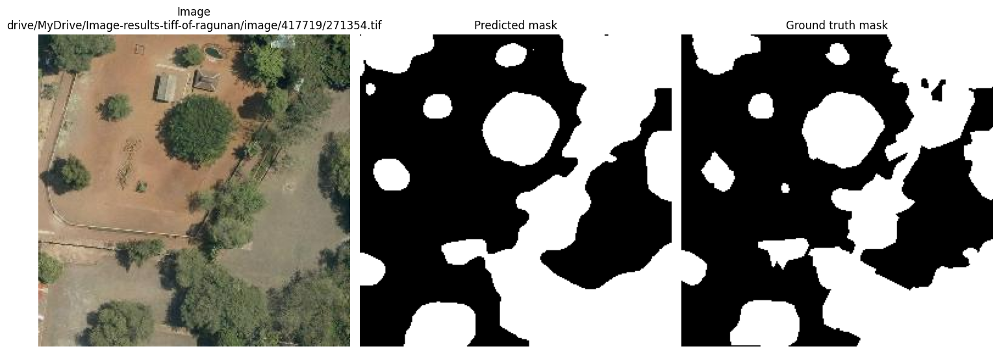

In [78]:
pred_masks = []
gt_masks = []
image_paths = []

with torch.no_grad():
    for image, mask, image_path, mask_path in test_loader:
        image = image.to(device)
        mask = mask.to(device)

        output = fine_tune_model(image)
        output = torch.sigmoid(output)
        pred_mask = (output > 0.5).float()

        for i in range(len(image_path)):
            img = image[i].cpu()
            img_path = image_path[i]

            if img.shape[0] == 1:
                img = img.squeeze(0).numpy()
            elif img.shape[0] == 3:
                img = img.permute(1, 2, 0).numpy()

            gt_mask = mask[i].cpu().squeeze().numpy()
            predicted_mask = pred_mask[i].cpu().squeeze().numpy()

            orig_image = Image.open(img_path).convert("RGB")
            orig_image = np.array(orig_image)

            gt_masks.append(gt_mask)
            pred_masks.append(predicted_mask)
            image_paths.append(img_path)

            plt.figure(figsize = (15, 8))
            plt.subplot(1, 3, 1)
            plt.imshow(orig_image)
            plt.axis("off")
            plt.title(f"Image\n{image_path[i]}")

            plt.subplot(1, 3, 2)
            plt.imshow(predicted_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Predicted mask")

            plt.subplot(1, 3, 3)
            plt.imshow(gt_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Ground truth mask")

            plt.tight_layout()
            plt.show()

In [79]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        return 1.0 if intersection == 0 else 0.0

    iou = intersection / union
    return iou

In [80]:
iou_scores = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    pred_mask = (pred_masks[i] > 0.5).astype(np.uint8)
    gt_mask = (gt_masks[i] > 0.5).astype(np.uint8)

    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    pixels = np.sum(pred_mask == 1)
    veg_area = pixels * (GSD_x * GSD_y)
    iou_score = calculate_iou(pred_mask, gt_mask)

    iou_scores.append(iou_score)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou_score}")
    print("=====================================================")

print("=====================================================")
print(f"Average IoU score: {np.mean(iou_scores)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 42944
Vegetation coverage area: 24170.167781721837
IoU score: 0.7883483900857077
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 48391
Vegetation coverage area: 3760.364430093478
IoU score: 0.7571028971028971
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 29691
Vegetation coverage area: 16710.9829453964
IoU score: 0.7467438082480691
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 43052
Vegetation coverage area: 24230.95341232043
IoU score: 0.8443116493603872
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 55317
Vege

In [83]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 24170.167781721837 m^2
Carbon density: 0.0067562443062405995 ton/m^2
Estimated carbon stock: 163.29955845613813 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3760.364430093478 m^2
Carbon density: 0.0067562443062405995 ton/m^2
Estimated carbon stock: 25.405940770208737 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 16710.9829453964 m^2
Carbon density: 0.0067562443062405995 ton/m^2
Estimated carbon stock: 112.9034833765182 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 24230.95341232043 m^2
Carbon density: 0.0067562443062405995 ton/m^2
Estimated carbon stock: 163.71024102677112 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
Vegetation coverage area: 4298.56955176543 m^2
Carbon density: 0.00